<a href="https://colab.research.google.com/github/Atmoboran/Historic-Weather-Visualizer/blob/main/Wettervisuals_interactive_workshop.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Historic Weather Data Visualizer for Programming Workshops**
## **Interactive, Step-by-Step Edition**

This script is designed to teach users how to download and visualize historic weather data using Python. It’s an excellent resource for educational purposes, including programming workshops and self-paced learning.

### **About This Version**
This is the **interactive, step-by-step edition** of the script, where users are guided to set constants and options themselves as they progress through the script. It’s ideal for those who want to understand the underlying processes in greater depth and gain hands-on experience with data handling and visualization.

### **Key Features**
- **Interactive Learning**: Users actively engage with the script by setting parameters and exploring the data.
- **In-Depth Explanations**: Detailed commentary throughout the script explains the steps and concepts, making it a valuable learning tool.
- **Data Exploration**: Includes tools and techniques for exploring the dataset before visualizing it.

### **Fully Automated Version**
For users who prefer a more streamlined approach, check out the [fully automated version](#). In that version:
- Users answer a few questions about what data they want to download and visualize at the start.
- The script handles downloading, processing, and visualization automatically.


## Load the required packages

In [1]:
# Load the required packages
import os  # For operating system functionalities such as file paths
import requests  # For handling HTTP requests
import xarray as xr  # For working with multi-dimensional labeled data (e.g., NetCDF files)
import matplotlib.pyplot as plt  # For creating visualizations
import urllib.request  # For downloading files from the web
import glob  # For finding all the pathnames matching a specified pattern
import matplotlib.animation as animation  # For creating animations with matplotlib
import numpy as np  # For numerical operations
from IPython.display import HTML  # For embedding HTML content (e.g., animations) in notebooks
import warnings  # For handling warning messages
import io
# Check if Cartopy is installed and install it if not
try:
    import cartopy  # Cartopy is already imported, but this ensures it's available
    print("Cartopy is already installed.")
except ImportError:
    print("Cartopy is not installed. Installing now...")
    !pip install cartopy
    import cartopy
    print("Cartopy has been installed.")
import cartopy.crs as ccrs  # For cartographic projections and transformations
import cartopy.feature as cfeature  # For adding features to maps in cartopy
print("All packages successfully imported.")




Cartopy is not installed. Installing now...
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.7/11.7 MB 25.7 MB/s eta 0:00:00
Cartopy has been installed.
All packages successfully imported.


### **Step: Define the Atmospheric Variable and Download the Dataset**

In this step, you will specify which atmospheric variable you want to download. To do this:
1. Define the year you want to download.
2. Uncomment (remove the `#`) the lines for `dataset` and `url` corresponding to the variable you want to download.
3. Comment (add a `#`) to the variables you do **not** want to download.

By making these changes, you are defining the URL of the dataset to be downloaded.

#### **Optional: Explore Datasets**
You can also visit the dataset's website (https://downloads.psl.noaa.gov/Datasets/20thC_ReanV3/) and choose a different variable to download.
More information about the dataset can be found: https://www.psl.noaa.gov/data/20thC_Rean/


However, keep in mind:
- This script is optimized for specific datasets.
- Using a dataset with a different spatial resolution or structure might cause issues during processing or visualization.

Be cautious when customizing the URL to ensure compatibility with the script.


In [2]:
# Define which year you want to download
year = 2006
year = str(year) # we have to transform the number (integer) to a word (string)

In [3]:
# Define the dataset and URL of the variable you want to download.

## 2m air temperature
# dataset = 'air.2m.'+year+'.nc' ### insert the name of the dataset you want to download
# url = f'https://downloads.psl.noaa.gov/Datasets/20thC_ReanV3/2mMO/'+dataset


# low clouds
dataset = 'tcdc.lowcld.'+str(year)+'.nc'
url = f'https://downloads.psl.noaa.gov/Datasets/20thC_ReanV3/cldLyrMO/'+dataset


## wind in north-south direction
# dataset = 'vwnd.10m.'+year+'.nc'
# url = f'https://downloads.psl.noaa.gov/Datasets/20thC_ReanV3/10mMO/'+dataset

## relative humidity
#dataset = 'rhum.2m.'+year+'.nc'
#url = f'https://downloads.psl.noaa.gov/Datasets/20thC_ReanV3/2mMO/'+dataset

## vegetation percent
# dataset = 'veg.'+year+'.nc'
# url = f'https://downloads.psl.noaa.gov/Datasets/20thC_ReanV3/sfc_paramsSI/'+dataset

# Soilmoisture
# dataset = 'soilm.'+year+'.nc'
# url = f'https://downloads.psl.noaa.gov/Datasets/20thC_ReanV3/subsfcMO/'+dataset

# rain
# dataset = 'crain.'+year+'.nc' # 'pres.sfc.'+year+'.nc'
# url = f'https://downloads.psl.noaa.gov/Datasets/20thC_ReanV3/sfcMO/'+dataset

In [4]:
# This actually downloads the data from the specified URL.

# Send an HTTP request to the specified URL to download the data
response = urllib.request.urlopen(url)

# Read the downloaded data into memory as a binary object
data = response.read()

# Create an in-memory file-like object from the binary data
# The data will be saved on google colabs RAM.
data_in_memory = io.BytesIO(data)

### **Step: Choose a Color Palette for the Plot**

In this step, you will define the color palette for your plot.

1. Visit the [Matplotlib colormap guide](https://matplotlib.org/stable/tutorials/colors/colormaps.html) to explore available color palettes.
2. Select a palette that suits your preferences or the data visualization needs.
3. Remember the name of the colormap you choose and assign it to the variable `palette` in the script.



In [5]:
# choose a colour palette
color_palette = 'viridis' # other examples: 'hsv' #'spring' # 'binary' 'viridis'

### **Step: Open the Dataset with Xarray and Explore Its Structure**

In this step, we will:
1. Open the downloaded dataset using the **xarray** package.
2. Examine the structure of the dataset to understand its dimensions, variables, and metadata.
3. Create a simple plot for a single timestep to visualize the data.

#### **Instructions:**
1. Use the `xarray.open_dataset()` function to load the dataset into an `xarray.Dataset`.
2. Have a look at the structure and details of the dataset.
3. Select a single timestep and use the `.plot()` function to create a quick visualization of the data.


In [6]:
# open the downloaded dataset
ds = xr.open_dataset(data_in_memory)
variable = list(ds.keys())[0] # Store the first variable name for further use

# Extract the full data for the selected variable
data_variable = ds[variable]  # `data_variable` now holds the full dataset for the variable

In [7]:
# have a look at the structure of the dataset
data_variable

<xarray.DataArray 'tcdc' (time: 2920, lat: 181, lon: 360)> Size: 761MB
[190267200 values with dtype=float32]
Coordinates:
  * lat      (lat) float32 724B -90.0 -89.0 -88.0 -87.0 ... 87.0 88.0 89.0 90.0
  * lon      (lon) float32 1kB 0.0 1.0 2.0 3.0 4.0 ... 356.0 357.0 358.0 359.0
  * time     (time) datetime64[ns] 23kB 2006-01-01 ... 2006-12-31T21:00:00
Attributes: (12/14)
    long_name:         3-hourly Low Cloud Cover
    units:             %
    GRIB_name:         TCDC
    var_desc:          Total cloud cover
    dataset:           NOAA/CIRES/DOE 20th Century Reanalysis version 3mo
    level_desc:        Low Cloud Layer
    ...                ...
    standard_name:     low_cloud_area_fraction
    valid_range:       [  0. 100.]
    statistic_method:  Ensemble mean is calculated by averaging over all 80 e...
    GridType:          Cylindrical Equidistant Projection Grid
    datum:             wgs84
    actual_range:      [  0. 100.]

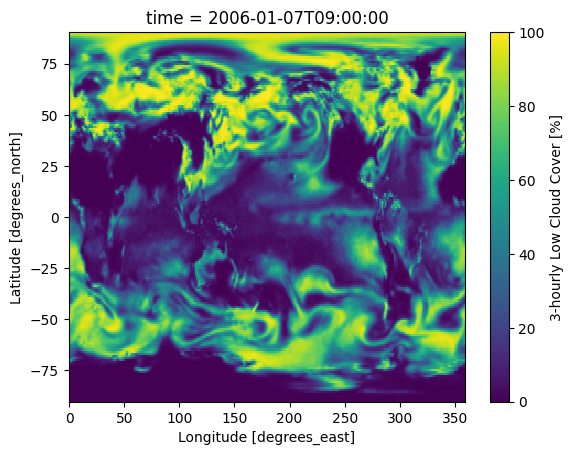

In [8]:
# this is just an example plot of one specific timestep to have a first look
timestep = 51 # you can also have a look at a different timestep
data_variable[timestep,:,:].plot(cmap=color_palette) # this is an in-built function from the xarray package, which makes it very easy to plot

### **Step: Transform the Dataset**

1. (Optional) Filter for Specific Timesteps
If desired, filter the dataset to extract only the 12:00 (UTC) timestep for each day. This step reduces the dataset to include only the data corresponding to this specific time.

2. Recenter the Dataset
The data is currently Pacific-centered (with longitudes from 0° to 360°). Recenter it to be Atlantic-centered (with longitudes from -180° to 180°). This transformation makes the dataset easier to interpret for Atlantic-focused analyses and visualizations.


In [9]:
# If you want, you can run this.
# This will extract/ filter only the 12:00 timestep (UTC) for each day from the dataset.

data_variable = data_variable.sel(time=ds['time'].dt.hour == [9])

In [10]:
# Determine the midpoint of the longitude dimension
lon_midpoint = len(data_variable['lon']) // 2  # Compute the midpoint index for longitude

# Slice the dataset to separate the western and eastern hemispheres
data_variable_west = data_variable[:, :, lon_midpoint:]  # From midpoint to the end
data_variable_east = data_variable[:, :, :lon_midpoint]  # From start to midpoint
data_variable_aligned = xr.concat([data_variable_west, data_variable_east], dim = 'lon')

lat = data_variable['lat']
data_variable['lon'] = range(-180, 180)
lon = data_variable['lon']


In [11]:
# have a look on the transformed dataset
data_variable

<xarray.DataArray 'tcdc' (time: 365, lat: 181, lon: 360)> Size: 95MB
[23783400 values with dtype=float32]
Coordinates:
  * lat      (lat) float32 724B -90.0 -89.0 -88.0 -87.0 ... 87.0 88.0 89.0 90.0
  * time     (time) datetime64[ns] 3kB 2006-01-01T09:00:00 ... 2006-12-31T09:...
  * lon      (lon) int64 3kB -180 -179 -178 -177 -176 ... 175 176 177 178 179
Attributes: (12/14)
    long_name:         3-hourly Low Cloud Cover
    units:             %
    GRIB_name:         TCDC
    var_desc:          Total cloud cover
    dataset:           NOAA/CIRES/DOE 20th Century Reanalysis version 3mo
    level_desc:        Low Cloud Layer
    ...                ...
    standard_name:     low_cloud_area_fraction
    valid_range:       [  0. 100.]
    statistic_method:  Ensemble mean is calculated by averaging over all 80 e...
    GridType:          Cylindrical Equidistant Projection Grid
    datum:             wgs84
    actual_range:      [  0. 100.]

### **Step: Define Geographic and Animation Parameters**

In this step, you will set parameters to:
1. Limit the Plot to a Specific Region:
   - Define the latitude (`lat_min`, `lat_max`) and longitude (`lon_min`, `lon_max`) ranges to focus the plot on a particular part of the world. Adjust the values as needed for your target region:
     - Latitude ranges from `-90` (South Pole) to `90` (North Pole).
     - Longitude ranges from `-180` to `179`, accounting for the dataset's longitude format.

2. Customize Animation Settings:
   - Duration of Each Frame (`interval`):
     - Set the duration of each frame in the animation, in milliseconds. For example, `interval = 200` makes each frame last 200ms.
   - Total Number of Frames (`frames`):
     - Define the total number of frames to include in the animation. For instance, `frames = 20` will create an animation with 20 frames. This corresponds to the amount of timesteps that are plotted.

By setting these parameters, you can focus the visualization on a specific geographic region and fine-tune the animation's duration and smoothness.


In [12]:
# Define the latitude and longitude ranges if you don't want to plot the whole world.

lat_min, lat_max = -60, 75  # Adjust these values as needed for your target region; between -90 and 90
lon_min, lon_max = -180, 179  # Adjusted for the dataset's longitude range; between -180 and 179

# Define the duration of each frame in the animation (milliseconds)
interval = 150

# Define the total number of frames for the animation
frames = 20

### **Step: Create an Animated Map Visualization**

In this final step, we create an animated map using the **Cartopy** library for geographic projections and **Matplotlib** for visualization. The animation displays how the selected atmospheric variable evolves over time within the defined geographic region.
You can comment/delete parts of the script in order to change the appearence of the animation. For example comment out lines 17-20 in order to create an animation without the world map.

In [13]:
# Create a figure with a PlateCarree projection from Cartopy
fig, ax = plt.subplots(figsize=(10, 6), subplot_kw={'projection': ccrs.PlateCarree()})

# Increase animation embedding limit for larger files
plt.rcParams['animation.embed_limit'] = 50

# Create a ScalarMappable for the colorbar and add it to the figure
sm = plt.cm.ScalarMappable(cmap=color_palette, norm=plt.Normalize(vmin=data_variable_aligned.min(), vmax=data_variable_aligned.max()))
sm._A = []  # Required for ScalarMappable
cbar = fig.colorbar(sm, ax=ax, orientation='vertical', fraction=0.02, pad=0.04)
cbar.set_label(data_variable_aligned.attrs['units'])  # Set the label to show the variable's units

# Define the animation function
def animate_map(frame):
    ax.clear()  # Clear the previous frame

    # # Set map extent and add coastlines and borders
    # ax.set_extent([lon_min, lon_max, lat_min, lat_max], crs=ccrs.PlateCarree())
    # ax.coastlines()
    # ax.add_feature(cfeature.BORDERS, linestyle='-')

    # Plot the current frame's data using imshow
    img = ax.imshow(
        data_variable_aligned[frame,
                              np.where(lat == lat_min)[0][0]:np.where(lat == lat_max)[0][0],
                              np.where(lon == lon_min)[0][0]:np.where(lon == lon_max)[0][0]],
        extent=[lon_min, lon_max, lat_min, lat_max],
        cmap=color_palette, origin='lower', transform=ccrs.PlateCarree()
    )

    # # Add a title with the time and variable's description
    # ax.set_title(str(data_variable['time'][frame].values).split('.')[0] + '     ' + data_variable_aligned.attrs['long_name'])

    # # Set axis labels and add gridlines
    # ax.set_xlabel('Longitude')
    # ax.set_ylabel('Latitude')
    # ax.set_xticks(np.linspace(lon_min, lon_max, num=5))  # Longitude ticks
    # ax.set_yticks(np.linspace(lat_min, lat_max, num=5))  # Latitude ticks
    # ax.gridlines(draw_labels=False, linewidth=0.5, color='gray', linestyle='--')  # Optional grid

# Close the figure to avoid displaying a static plot
plt.close(fig)

# Create the animation using FuncAnimation
ani = animation.FuncAnimation(fig, animate_map, frames=frames, interval=interval, blit=False)

ani.save(variable+'_'+str(year)+'_animation.mp4', writer='ffmpeg', fps=10)

# Display the animation inline in the notebook
display(HTML(ani.to_jshtml()))